# eval trained or-panoptic model on val set data

Adapted from notebooks/vis_or_panoptic.ipynb

In [2]:
%load_ext autoreload
%autoreload 2

import glob
from pathlib import Path
import multiprocessing as mp
import os
# fmt: off
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
if str(Path(module_path) / 'demo') not in sys.path:
    sys.path.append(str(Path(module_path) / 'demo'))

import tempfile
import time
import warnings

import cv2
import numpy as np
import tqdm

from detectron2.config import get_cfg
from detectron2.data.detection_utils import read_image
from detectron2.projects.deeplab import add_deeplab_config
from detectron2.utils.logger import setup_logger

from predictor import VisualizationDemo


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/home/ruizhu/miniconda3/envs/py310matsegnerf/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Namespace(config_file='../configs/or-panoptic/maskformer2_R50_bs16_50ep.yaml', webcam=False, video_input=None, input=None, output=None, confidence_threshold=0.5, opts=['MODEL.WEIGHTS', '../output_or_panoptic_trainval/model_0114999.pth'])


100%|██████████| 5376/5376 [00:00<00:00, 50107.06it/s]
/home/ruizhu/miniconda3/envs/py310matsegnerf/lib/python3.10/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3491.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Saved to ../output_or_panoptic_trainval/vis/model_0114999/0.png


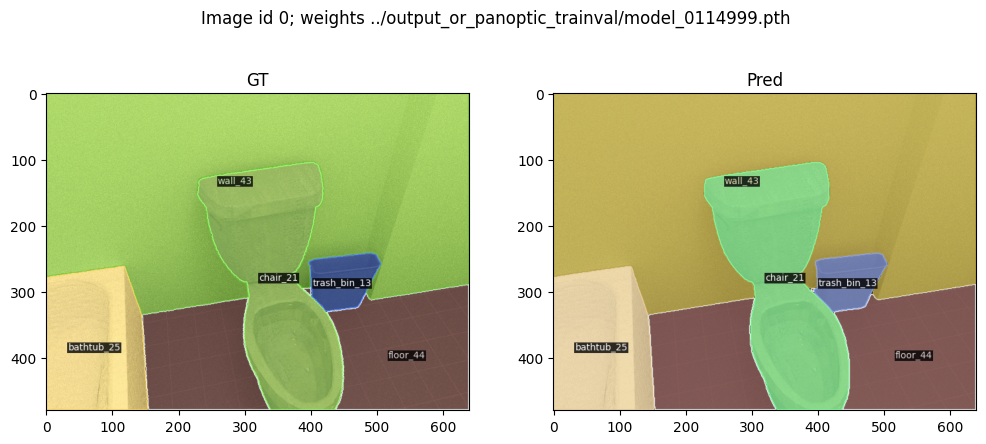

Saved to ../output_or_panoptic_trainval/vis/model_0114999/1.png


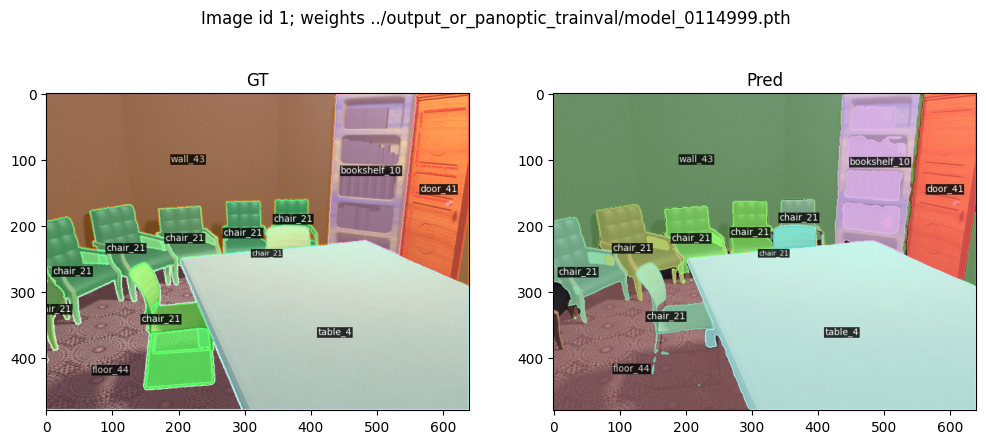

Saved to ../output_or_panoptic_trainval/vis/model_0114999/2.png


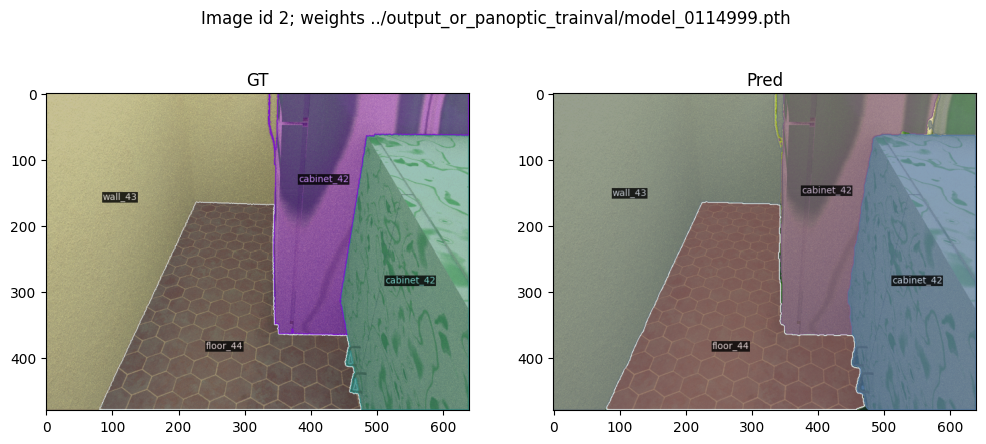

Saved to ../output_or_panoptic_trainval/vis/model_0114999/3.png


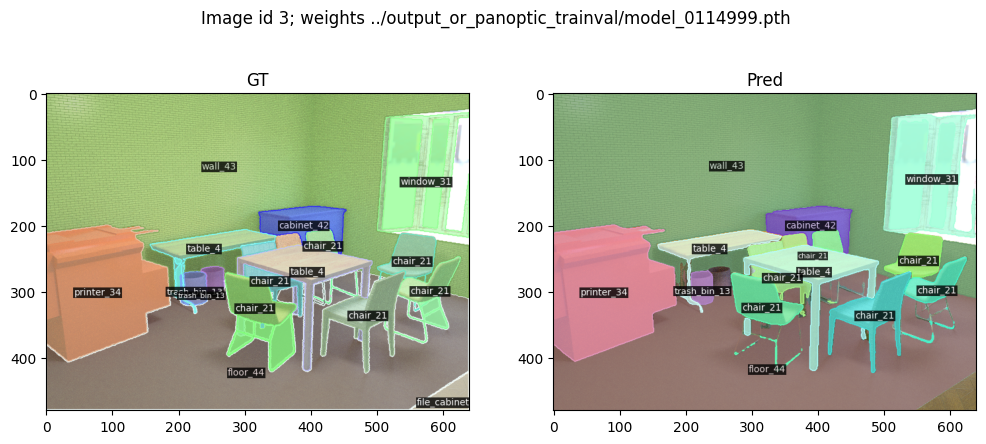

Saved to ../output_or_panoptic_trainval/vis/model_0114999/4.png


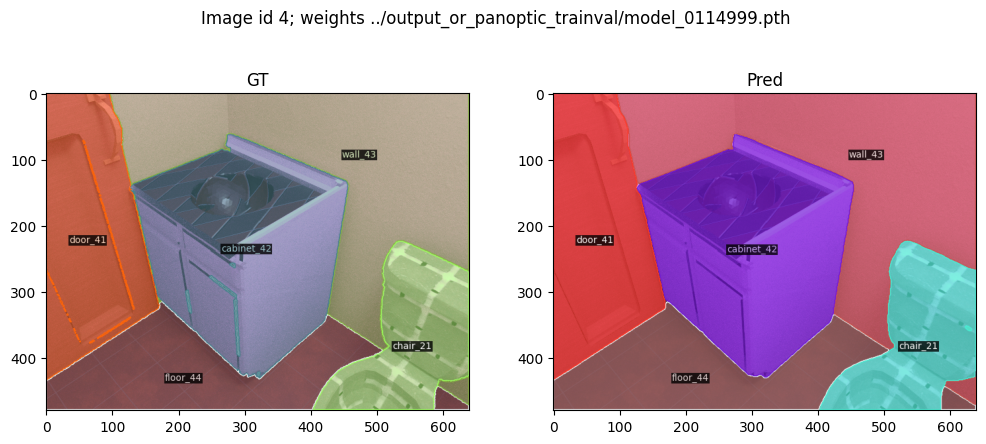

Saved to ../output_or_panoptic_trainval/vis/model_0114999/5.png


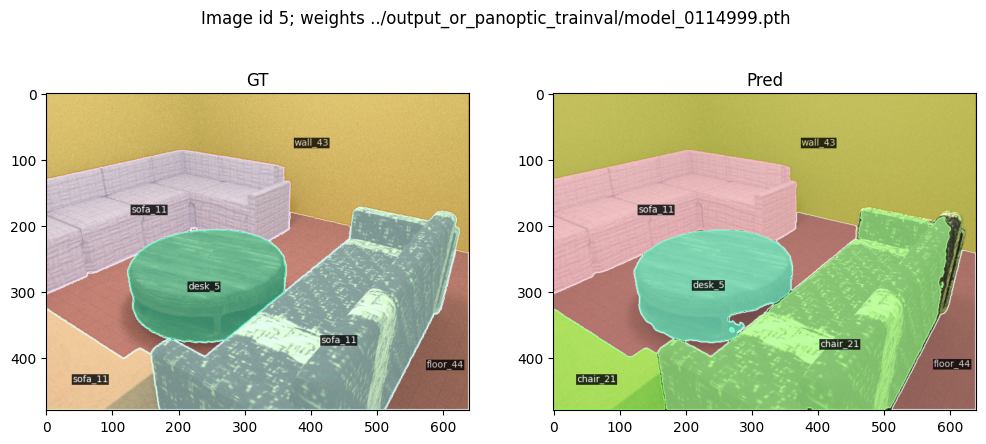

Saved to ../output_or_panoptic_trainval/vis/model_0114999/6.png


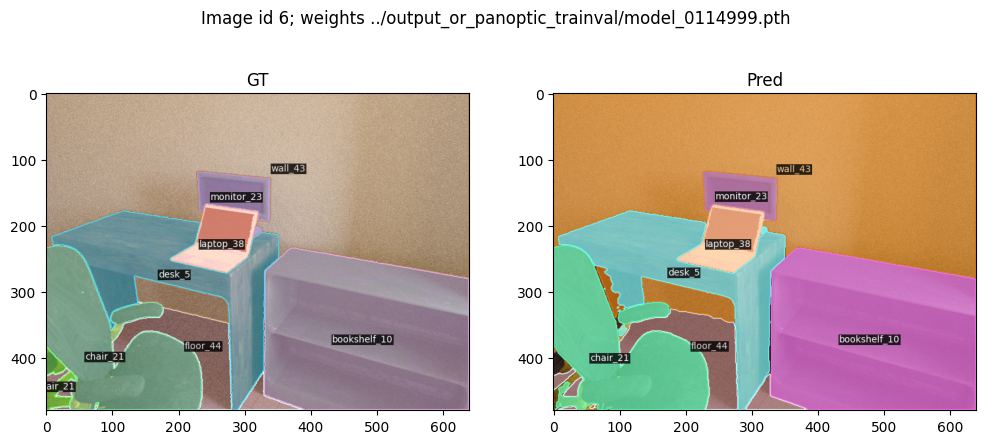

Saved to ../output_or_panoptic_trainval/vis/model_0114999/7.png


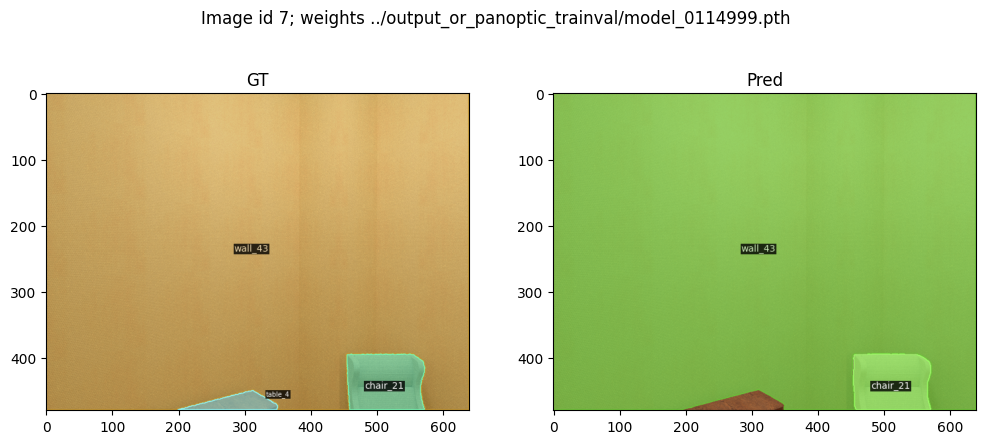

Saved to ../output_or_panoptic_trainval/vis/model_0114999/8.png


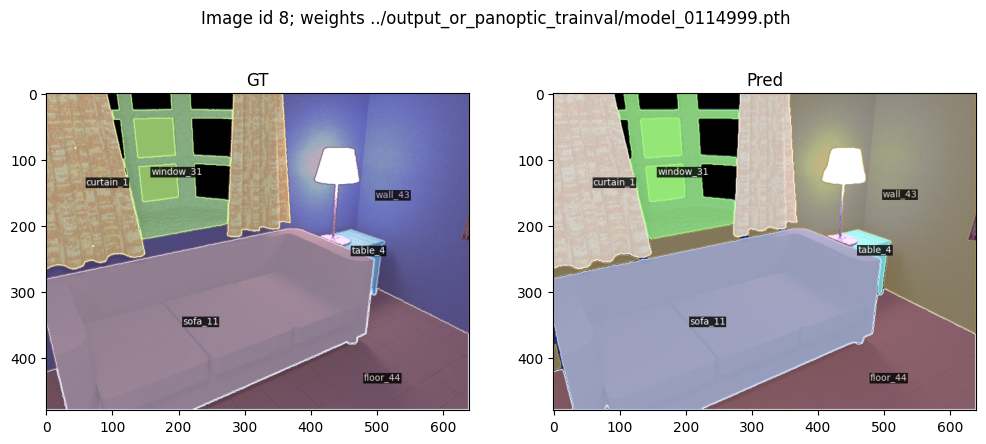

Saved to ../output_or_panoptic_trainval/vis/model_0114999/9.png


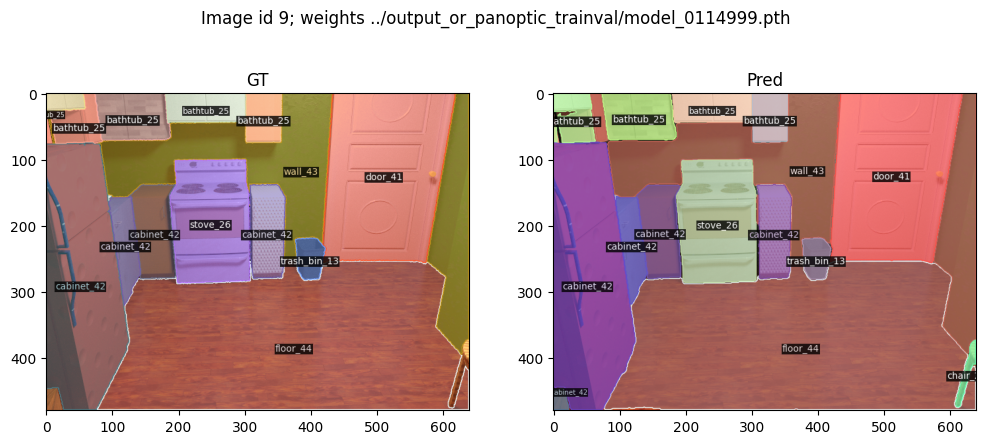

Saved to ../output_or_panoptic_trainval/vis/model_0114999/10.png


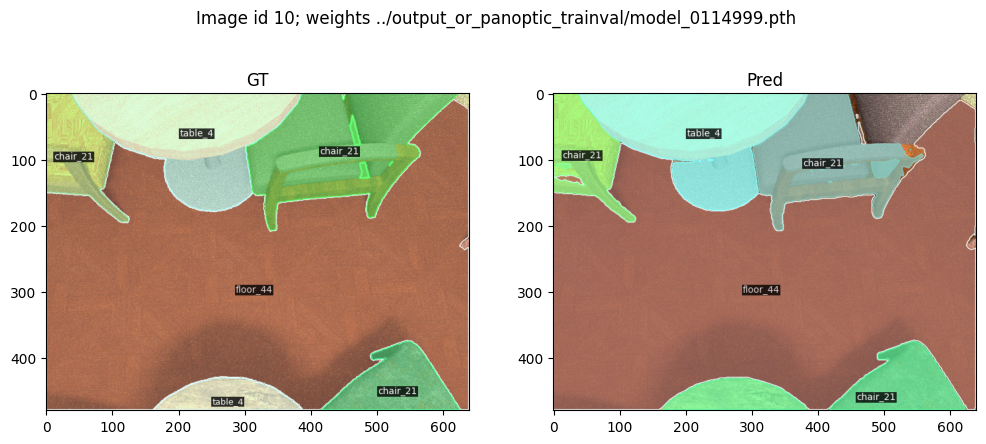

Saved to ../output_or_panoptic_trainval/vis/model_0114999/11.png


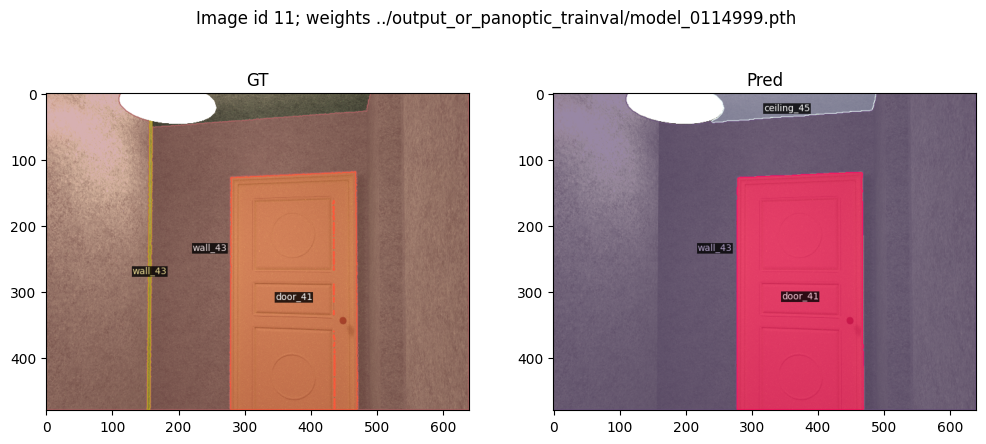

Saved to ../output_or_panoptic_trainval/vis/model_0114999/12.png


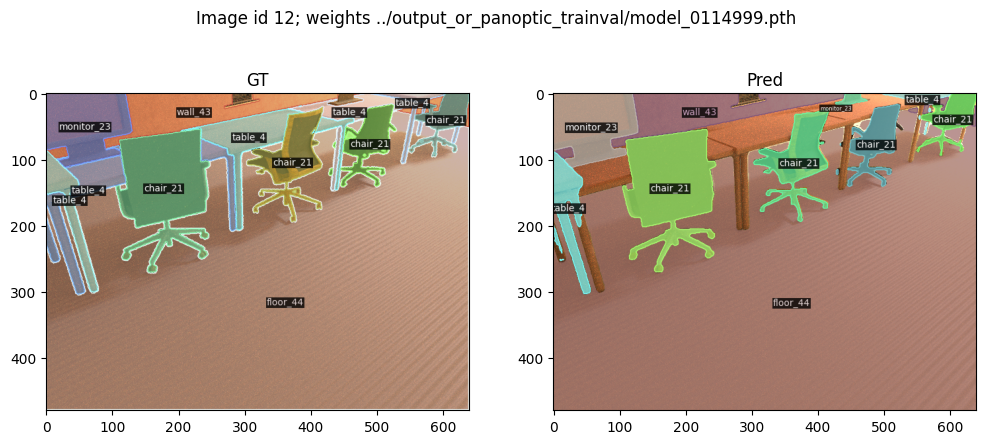

Saved to ../output_or_panoptic_trainval/vis/model_0114999/13.png


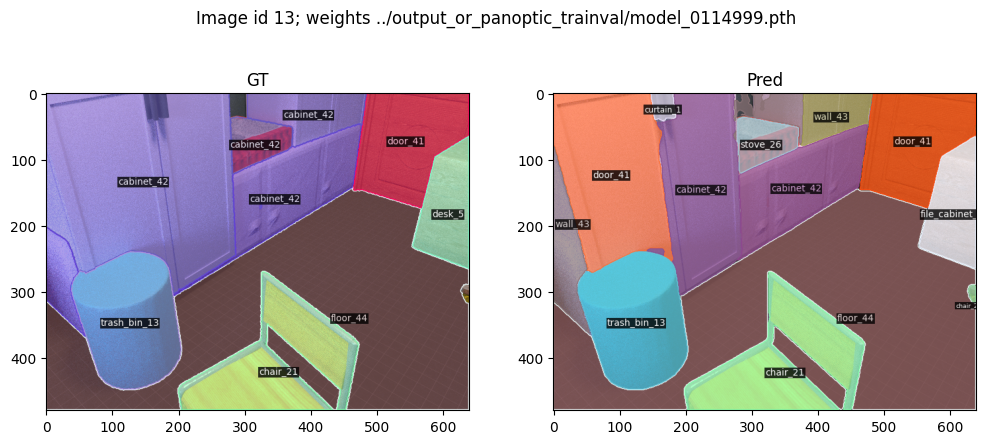

Saved to ../output_or_panoptic_trainval/vis/model_0114999/14.png


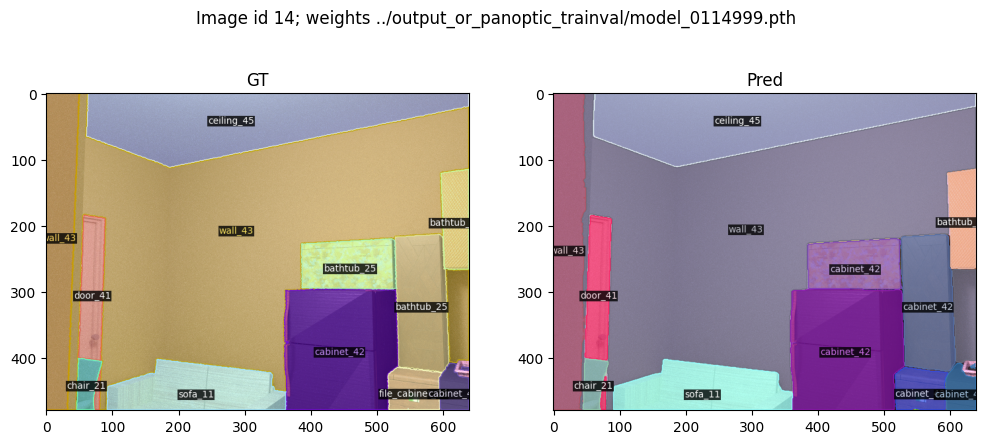

Saved to ../output_or_panoptic_trainval/vis/model_0114999/15.png


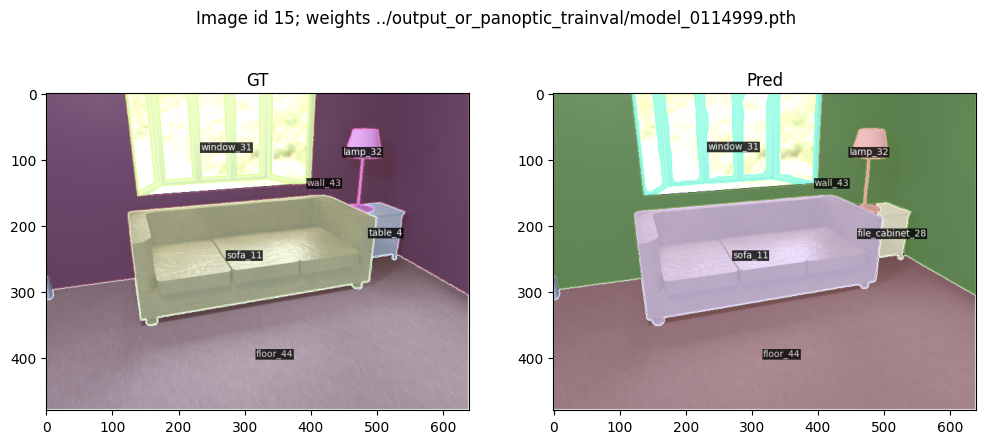

Saved to ../output_or_panoptic_trainval/vis/model_0114999/16.png


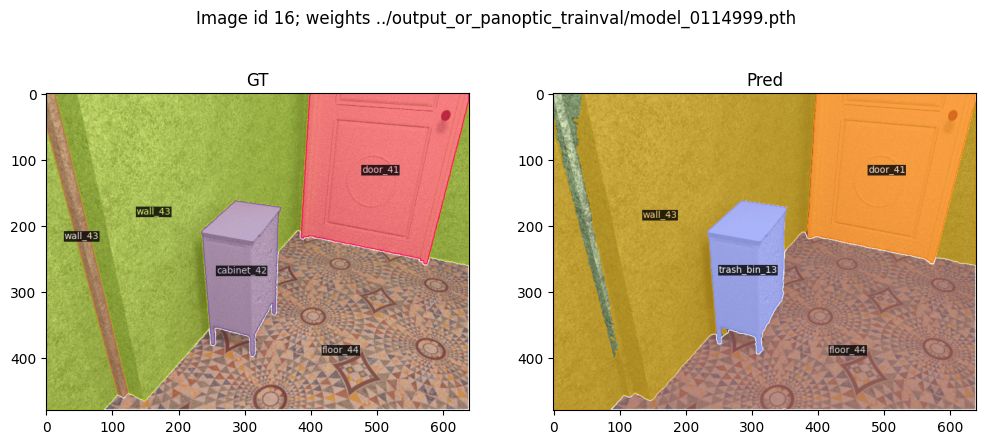

Saved to ../output_or_panoptic_trainval/vis/model_0114999/17.png


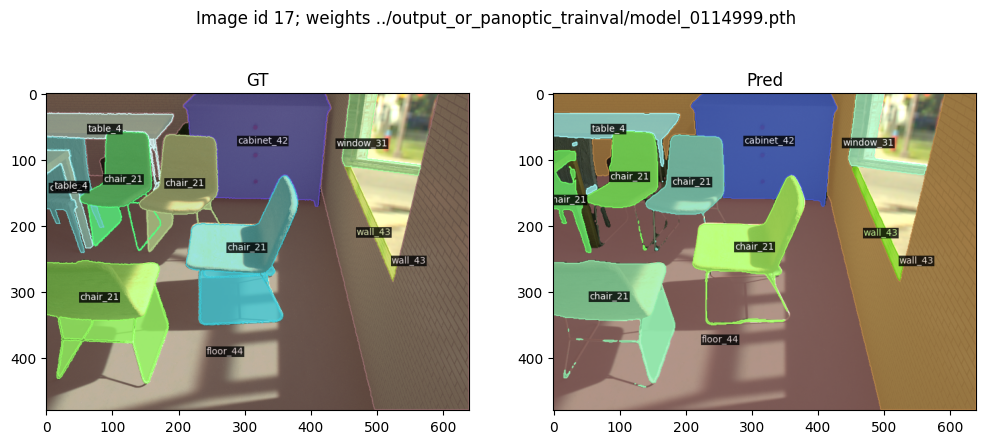

Saved to ../output_or_panoptic_trainval/vis/model_0114999/18.png


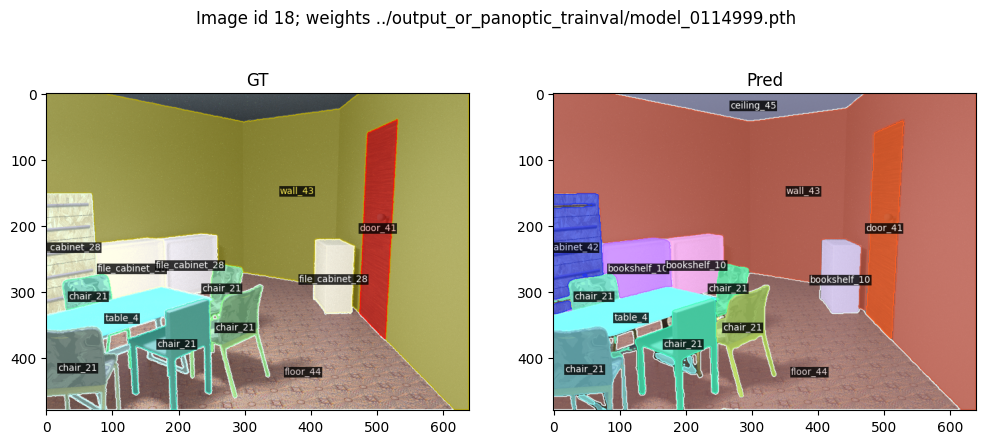

Saved to ../output_or_panoptic_trainval/vis/model_0114999/19.png


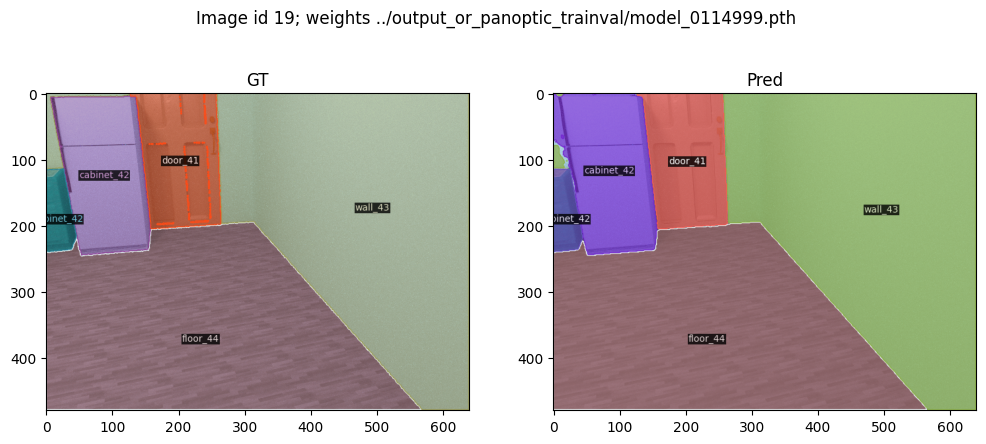

In [3]:
from demo import setup_cfg, get_parser
parser = get_parser()
args_str = '--config-file ../configs/or-panoptic/maskformer2_R50_bs16_50ep.yaml --opts MODEL.WEIGHTS ../output_or_panoptic_trainval/model_0114999.pth'
args = parser.parse_args(args_str.split(' '))
print(args)
cfg = setup_cfg(args)
demo = VisualizationDemo(cfg)

from detectron2.data import MetadataCatalog, DatasetCatalog
or_panoptic_metadata = MetadataCatalog.get("or_panoptic_val")
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

from mask2former.data.datasets.register_or_panoptic import load_or_panoptic_json, get_metadata
metadata = get_metadata()
panoptic_json = '/data/OpenRooms_public/im_pan_seg_rgb_val.json'
assert Path(panoptic_json).exists(), panoptic_json
image_root = '/data/OpenRooms_public'
panoptic_root = '/data/OpenRooms_public/im_pan_seg_rgb'

dataset_dicts = load_or_panoptic_json(
    panoptic_json, image_root, panoptic_root, metadata
)

vis_save_dir = Path(cfg.MODEL.WEIGHTS).parent / 'vis' / str(Path(cfg.MODEL.WEIGHTS).stem)
vis_save_dir.mkdir(exist_ok=True, parents=True)

for d in dataset_dicts[:20]:
    img = cv2.imread(d["file_name"])[:, :, ::-1]
    visualizer = Visualizer(img[:, :, ::-1], metadata=or_panoptic_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    
    predictions, visualized_output = demo.run_on_image(img)

    # cv2_imshow(out.get_image()[:, :, ::-1])
    fig = plt.figure(figsize=(12, 5))
    fig.suptitle('Image id %d; weights %s' % (d['image_id'], cfg.MODEL.WEIGHTS))
    ax = plt.subplot(1, 2, 1)
    plt.imshow(out.get_image()[:, :, ::-1])
    ax.set_title('GT')
    ax = plt.subplot(1, 2, 2)
    plt.imshow(visualized_output.get_image()[:, :, ::-1])
    ax.set_title('Pred')
    
    vis_save_path = vis_save_dir / ('%d.png' % d['image_id'])
    plt.savefig(vis_save_path)
    print('Saved to', vis_save_path)
    
    plt.show()
    
    # pan_seg_file_name = d['pan_seg_file_name']
    # assert Path(pan_seg_file_name).exists()
